In [1]:
import plotly.express as px
fig = px.bar(x=["a", "b", "c"], y=[1, 3, 2])
fig.show()

In [1]:
import numpy
import umap

/Users/jsb/miniconda3/envs/umap310/lib/python3.10/site-packages/umap/distances.py:1063: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/Users/jsb/miniconda3/envs/umap310/lib/python3.10/site-packages/umap/distances.py:1071: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/Users/jsb/miniconda3/envs/umap310/lib/python3.10/site-packages/umap/d

In [2]:
numpy.__version__

'1.24.4'

In [2]:
from __future__ import annotations

import requests
import os
import json
from multiprocessing import Pool
from concurrent.futures import ThreadPoolExecutor

from PIL import Image
from transformers import CLIPProcessor, CLIPModel
from matplotlib import pyplot as plta
import faiss
import numpy as np
import pandas as pd
import torch
from torch.utils.data import Dataset, DataLoader
from tqdm import tqdm

In [3]:
data_path = '/Users/jsb/repos/moodboard/data/asos/all_products_8799.json'

In [4]:
import json

with open(data_path, 'r') as fp:
    products = json.loads(fp.readline())

In [5]:
products[0]

{'id': 200604040,
 'name': 'Mango short sleeve maxi dress in black',
 'price': {'current': {'value': 29.0, 'text': '$29.00'},
  'previous': {'value': None, 'text': ''},
  'rrp': {'value': 48.0, 'text': '$48.00'},
  'isMarkedDown': False,
  'isOutletPrice': True,
  'currency': 'USD'},
 'colour': 'Black',
 'colourWayId': 200604041,
 'brandName': 'Mango',
 'hasVariantColours': False,
 'hasMultiplePrices': False,
 'groupId': None,
 'productCode': 105018995,
 'productType': 'Product',
 'url': 'mango/mango-short-sleeve-maxi-dress-in-black/prd/200604040?clr=black&colourWayId=200604041',
 'imageUrl': 'images.asos-media.com/products/mango-short-sleeve-maxi-dress-in-black/200604040-1-black',
 'additionalImageUrls': ['images.asos-media.com/products/mango-short-sleeve-maxi-dress-in-black/200604040-2',
  'images.asos-media.com/products/mango-short-sleeve-maxi-dress-in-black/200604040-3',
  'images.asos-media.com/products/mango-short-sleeve-maxi-dress-in-black/200604040-4'],
 'videoUrl': 'video.asos

In [6]:
# tweaked from https://huggingface.co/docs/transformers/model_doc/clip#transformers.CLIPModel.forward.returns

# below is standard CLIP usage to score text snippets against a photo

model = CLIPModel.from_pretrained("openai/clip-vit-base-patch32")

processor = CLIPProcessor.from_pretrained("openai/clip-vit-base-patch32")

In [7]:
def images_to_embeddings(images: list[Image]) -> torch.tensor:
    """"""
    vinput = processor(images=images, return_tensors="pt")

    voutput = model.vision_model(
        **vinput
    )

    vembeds = voutput[1]

    vembeds = model.visual_projection(vembeds)

    vembeds = vembeds / vembeds.norm(p=2, dim=-1, keepdim=True)
    
    return vembeds

In [8]:
def text_to_embeddings(text: list[str]) -> torch.tensor:
    tinput = processor(text=text, padding=True, return_tensors="pt")
    tembeds = model.text_model(**tinput)[1]
    tembeds = model.text_projection(tembeds)
    tembeds = tembeds / tembeds.norm(p=2, dim=-1, keepdim=True) 
    return tembeds

In [9]:
class AsosClothingDataset(Dataset):
    """
    dataset found at https://data.world/promptcloud/amazon-fashion-products-2020/file/marketing_sample_for_amazon_com-amazon_fashion_products__20200201_20200430__30k_data.ldjson
    downloads dataset images fast with multithreading, and includes 
    category-specific subsetting for fast recommendation over a category
    """
    @staticmethod
    def read_records(fpath):
        records = []
        with open(fpath, 'r') as fp:
            for line in fp:
                records.append(json.loads(line))
        return records
    
    def _download(self, record):
        """download a single record"""
        md = None
        try:
            image_url = "https://" + record["imageUrl"]
            image_path = os.path.join(self.image_dir, str(record["id"]) + ".jpg")
            if not os.path.exists(image_path):
                image = Image.open(requests.get(image_url, stream=True).raw)
                image.save(image_path)

            label = f"a catalog photo of {record['name']}"
            
            category = "dress"

            md = {
                "product_id": record["id"],
                "image_path": image_path,
                "image_url": image_url,
                "label": label,
                "category": category,
            }
        except:
            print('failed')
            md = None

        return md

    @staticmethod
    def _thread_run(f, my_iter):
        """download all records using multithreading"""
        with ThreadPoolExecutor() as executor:
            results = list(tqdm(executor.map(f, my_iter), total=len(my_iter)))
        return results


    def __init__(self, image_dir: str, records: List[dict]):
        
        ids = [rec["id"] for rec in records]
        
        self.image_dir = image_dir
        
        os.makedirs(self.image_dir, exist_ok=True)
        
        # download images and return metadata
#         mds = []
#         for record in records:
#             md = self._download(record)
#             mds.append(md)
        
        mds = self._thread_run(self._download, records)
        mds = [md for md in mds if md is not None]
    
        self.metadata = pd.DataFrame(mds)
        self.metadata.set_index("product_id")
        self.metadata.sort_index()
        self.metadata.reset_index(drop=True)
        
    def __getitem__(self, idx: int) -> (Image, str, str):
        md = self.metadata.iloc[idx]
        
        try:
            image = Image.open(md.image_path)
        except:
            image = None

        return (image, md.label, md.category)
    
    def __len__(self,) -> int:
        return len(self.metadata)
    
    
    def get_category_indices(self, category: str) -> np.array:
        """return the indices of all products in this category"""
        md = self.metadata[self.metadata.category == category]
        return md.index

In [10]:
image_dir = "/Users/jsb/repos/moodboard/TEST/"

records = products

asos_dataset = AsosClothingDataset(image_dir=image_dir, records=records)

100%|██████████████████████████████████████████████| 19545/19545 [00:00<00:00, 185714.80it/s]


In [11]:
asos_dataset.metadata.head()

,product_id,image_path,image_url,label,category
0,200604040,/Users/jsb/repos/moodboard/TEST/200604040.jpg,https://images.asos-media.com/products/mango-s...,a catalog photo of Mango short sleeve maxi dre...,dress
1,203527789,/Users/jsb/repos/moodboard/TEST/203527789.jpg,https://images.asos-media.com/products/vesper-...,a catalog photo of Vesper square neck thigh sp...,dress
2,203897636,/Users/jsb/repos/moodboard/TEST/203897636.jpg,https://images.asos-media.com/products/naanaa-...,a catalog photo of NaaNaa sequin mini dress wi...,dress
3,203897814,/Users/jsb/repos/moodboard/TEST/203897814.jpg,https://images.asos-media.com/products/naanaa-...,a catalog photo of NaaNaa sequin long sleeve d...,dress
4,203899196,/Users/jsb/repos/moodboard/TEST/203899196.jpg,https://images.asos-media.com/products/naanaa-...,a catalog photo of NaaNaa cowl neck satin maxi...,dress


In [12]:
len(asos_dataset.metadata)

19545

# pre-calculate embeddings for all dataset products

In [13]:
def collate_fn(batch):
    images, labels, categories = [], [], []
    for item in batch:
        image, label, category = item
        # filter out any datapoints with corrupt images
        if image is not None:
            images.append(image)
            labels.append(label)
            categories.append(category)
    return images, labels, categories


data_loader = DataLoader(
    dataset = asos_dataset,
    collate_fn = collate_fn,
    batch_size = 32,
    shuffle = False,
)

In [ ]:
os.remove(embeddings_path)

In [14]:
embeddings_path = os.path.join(image_dir, 'asos_embeddings.npy')

if not os.path.exists(embeddings_path):
    candidate_vembeds = []

    count = 0
    for imgs, labs, cats in tqdm(data_loader):
        count += len(imgs)
        with torch.no_grad():
            candidate_vembeds.append(images_to_embeddings(imgs))

    candidate_vembeds = torch.concat(candidate_vembeds)
    candidate_vembeds = candidate_vembeds.detach().numpy()
    np.save(embeddings_path, candidate_vembeds)

candidate_vembeds = np.load(embeddings_path)

# visualize embeddings

In [16]:
from sklearn.manifold import TSNE
import time

start = time.time()
tsne = TSNE(n_components = 3, random_state=0)
projections = tsne.fit_transform(candidate_vembeds)
end = time.time()
print(f"generating projections with T-SNE took: {(end-start):.2f} sec")

generating projections with T-SNE took: 100.89 sec


In [15]:
import umap
from time import time

start = time()
umap_projections = umap.UMAP(n_components = 3).fit_transform(candidate_vembeds)
end = time()
print(f"generating projections with umap took: {(end-start):.2f} sec")

generating projections with umap took: 16.05 sec


In [16]:
import plotly.express as px

In [17]:
asos_dataset.metadata.head()

,product_id,image_path,image_url,label,category
0,200604040,/Users/jsb/repos/moodboard/TEST/200604040.jpg,https://images.asos-media.com/products/mango-s...,a catalog photo of Mango short sleeve maxi dre...,dress
1,203527789,/Users/jsb/repos/moodboard/TEST/203527789.jpg,https://images.asos-media.com/products/vesper-...,a catalog photo of Vesper square neck thigh sp...,dress
2,203897636,/Users/jsb/repos/moodboard/TEST/203897636.jpg,https://images.asos-media.com/products/naanaa-...,a catalog photo of NaaNaa sequin mini dress wi...,dress
3,203897814,/Users/jsb/repos/moodboard/TEST/203897814.jpg,https://images.asos-media.com/products/naanaa-...,a catalog photo of NaaNaa sequin long sleeve d...,dress
4,203899196,/Users/jsb/repos/moodboard/TEST/203899196.jpg,https://images.asos-media.com/products/naanaa-...,a catalog photo of NaaNaa cowl neck satin maxi...,dress


In [18]:
df = pd.DataFrame(umap_projections)

df["label"] = asos_dataset.metadata.label
df.head()

,0,1,2,label
0,5.752231,8.682472,6.720314,a catalog photo of Mango short sleeve maxi dre...
1,6.661962,4.447841,5.738616,a catalog photo of Vesper square neck thigh sp...
2,6.055309,6.500288,5.632848,a catalog photo of NaaNaa sequin mini dress wi...
3,9.165801,6.028784,5.404265,a catalog photo of NaaNaa sequin long sleeve d...
4,6.662885,4.406806,5.729827,a catalog photo of NaaNaa cowl neck satin maxi...


In [19]:


fig = px.scatter_3d(
    df, x=0, y=1, z=2, hover_name="label",
)
fig.update_traces(marker_size=1)
fig.show()


In [20]:
start = time()
umap_projections = umap.UMAP(n_components = 2).fit_transform(candidate_vembeds)
end = time()
print(f"generating projections with umap took: {(end-start):.2f} sec")

generating projections with umap took: 3.84 sec


In [21]:
df = pd.DataFrame(umap_projections)

df["label"] = asos_dataset.metadata.label
df.head()

fig = px.scatter(
    df, x=0, y=1, hover_name="label",
)
fig.update_traces(marker_size=1)
fig.show()

In [32]:
list(asos_dataset.metadata.image_path.values)

['/Users/jsb/repos/moodboard/TEST/200604040.jpg',
 '/Users/jsb/repos/moodboard/TEST/203527789.jpg',
 '/Users/jsb/repos/moodboard/TEST/203897636.jpg',
 '/Users/jsb/repos/moodboard/TEST/203897814.jpg',
 '/Users/jsb/repos/moodboard/TEST/203899196.jpg',
 '/Users/jsb/repos/moodboard/TEST/204097500.jpg',
 '/Users/jsb/repos/moodboard/TEST/204483720.jpg',
 '/Users/jsb/repos/moodboard/TEST/204669445.jpg',
 '/Users/jsb/repos/moodboard/TEST/204692023.jpg',
 '/Users/jsb/repos/moodboard/TEST/204740491.jpg',
 '/Users/jsb/repos/moodboard/TEST/204877582.jpg',
 '/Users/jsb/repos/moodboard/TEST/204877590.jpg',
 '/Users/jsb/repos/moodboard/TEST/204877907.jpg',
 '/Users/jsb/repos/moodboard/TEST/203897757.jpg',
 '/Users/jsb/repos/moodboard/TEST/203897893.jpg',
 '/Users/jsb/repos/moodboard/TEST/203447452.jpg',
 '/Users/jsb/repos/moodboard/TEST/203987907.jpg',
 '/Users/jsb/repos/moodboard/TEST/204945235.jpg',
 '/Users/jsb/repos/moodboard/TEST/203853971.jpg',
 '/Users/jsb/repos/moodboard/TEST/204688035.jpg',


In [23]:
from sklearn.cluster import AgglomerativeClustering, AffinityPropagation

clusterer = AgglomerativeClustering(
    n_clusters=10, 
    affinity='deprecated', 
    metric="cosine", 
    memory=None, 
    connectivity=None, 
    compute_full_tree='auto', 
    linkage='complete', 
    distance_threshold=None, 
    compute_distances=False,
)

labels = clusterer.fit_predict(candidate_vembeds)

In [32]:
from sklearn.cluster import AffinityPropagation

clusterer = AffinityPropagation(
    damping=0.5, 
    max_iter=200, 
    convergence_iter=15, 
    copy=True, 
    preference=None, 
    affinity='euclidean', 
    verbose=False, 
    random_state=None)

labels = clusterer.fit_predict(candidate_vembeds)

/Users/jsb/miniconda3/envs/umap310/lib/python3.10/site-packages/sklearn/cluster/_affinity_propagation.py:142: ConvergenceWarning:

Affinity propagation did not converge, this model may return degenerate cluster centers and labels.



In [33]:
from sklearn.cluster import HDBSCAN

clusterer2 = HDBSCAN(min_cluster_size=5,)

labels2 = clusterer2.fit_predict(candidate_vembeds)

In [35]:
np.unique(labels2)

array([-1,  0,  1])

In [36]:
import io
import base64
import pickle
import gzip

import numpy as np

from jupyter_dash import JupyterDash
from dash import Dash, dcc, html, Input, Output, no_update
import plotly.graph_objects as go

from PIL import Image

# Helper functions
def image_path_to_base64(image_path):
    im = Image.open(image_path)
    buffer = io.BytesIO()
    im.save(buffer, format="jpeg")
    encoded_image = base64.b64encode(buffer.getvalue()).decode()
    im_url = "data:image/jpeg;base64, " + encoded_image
    return im_url

# get image paths
image_paths = list(asos_dataset.metadata.image_path.values)
image_labels = list(asos_dataset.metadata.label.values)

# UMAP projections
start = time()
umap_projections = umap.UMAP(n_components = 3).fit_transform(candidate_vembeds)
end = time()
print(f"generating projections with umap took: {(end-start):.2f} sec")

# Color for each digit
color_map = {
    0: "#E52B50",
    1: "#9F2B68",
    -1: "#3B7A57",
    3: "#3DDC84",
    4: "#FFBF00",
    5: "#915C83",
    6: "#008000",
    7: "#7FFFD4",
    8: "#E9D66B",
    9: "#007FFF",
}
colors = [color_map[l] for l in labels2]

fig = go.Figure(data=[go.Scatter3d(
    x=umap_projections[:, 0],
    y=umap_projections[:, 1],
    z=umap_projections[:, 2],
    mode='markers',
    marker=dict(
        size=2,
        color=colors,
    )
)])

fig.update_traces(
    hoverinfo="none",
    hovertemplate=None,
)
fig.update_layout(
    scene=dict(
        xaxis=dict(range=[-10,10]),
        yaxis=dict(range=[-10,10]),
        zaxis=dict(range=[-10,10]),   
    )
)

app = Dash(__name__)

app.layout = html.Div(
    className="container",
    children=[
        dcc.Graph(id="graph-5", figure=fig, clear_on_unhover=True),
        dcc.Tooltip(id="graph-tooltip-5", direction='bottom'),
    ],
)

@app.callback(
    Output("graph-tooltip-5", "show"),
    Output("graph-tooltip-5", "bbox"),
    Output("graph-tooltip-5", "children"),
    Input("graph-5", "hoverData"),
)
def display_hover(hoverData):
    if hoverData is None:
        return False, no_update, no_update

    # demo only shows the first point, but other points may also be available
    hover_data = hoverData["points"][0]
    bbox = hover_data["bbox"]
    num = hover_data["pointNumber"]

    im_path = image_paths[num]
    im_url = image_path_to_base64(im_path)
    image_label = image_labels[num]
    children = [
        html.Div([
            html.Img(
                src=im_url,
                style={"width": "50px", 'display': 'block', 'margin': '0 auto'},
            ),
            html.P(f"{image_label}", style={'font-weight': 'bold'})
        ])
    ]

    return True, bbox, children

if __name__ == "__main__":
    app.run(jupyter_mode="tab", debug=True)

generating projections with umap took: 3.80 sec
Dash app running on http://127.0.0.1:8050/


<IPython.core.display.Javascript object>

In [38]:
import io
import base64
import pickle
import gzip

import numpy as np

from jupyter_dash import JupyterDash
from dash import Dash, dcc, html, Input, Output, no_update
import plotly.graph_objects as go

from PIL import Image

# Helper functions
def image_path_to_base64(image_path):
    im = Image.open(image_path)
    buffer = io.BytesIO()
    im.save(buffer, format="jpeg")
    encoded_image = base64.b64encode(buffer.getvalue()).decode()
    im_url = "data:image/jpeg;base64, " + encoded_image
    return im_url

# get image paths
image_paths = list(asos_dataset.metadata.image_path.values)

# UMAP projections
start = time()
umap_projections = umap.UMAP(n_components = 2).fit_transform(candidate_vembeds)
end = time()
print(f"generating projections with umap took: {(end-start):.2f} sec")

# Color for each digit
color_map = {
    0: "#E52B50",
    1: "#9F2B68",
    -1: "#3B7A57",
    3: "#3DDC84",
    4: "#FFBF00",
    5: "#915C83",
    6: "#008000",
    7: "#7FFFD4",
    8: "#E9D66B",
    9: "#007FFF",
}
colors = [color_map[l] for l in labels2]

fig = go.Figure(data=[go.Scatter(
    x=umap_projections[:, 0],
    y=umap_projections[:, 1],
    mode='markers',
    marker=dict(
        size=2,
        color=colors,
    )
)])

fig.update_traces(
    hoverinfo="none",
    hovertemplate=None,
)
fig.update_layout(
    scene=dict(
        xaxis=dict(range=[-10,10]),
        yaxis=dict(range=[-10,10]),
    )
)

app = Dash(__name__)

app.layout = html.Div(
    className="container",
    children=[
        dcc.Graph(id="graph-5", figure=fig, clear_on_unhover=True),
        dcc.Tooltip(id="graph-tooltip-5", direction='bottom'),
    ],
)

@app.callback(
    Output("graph-tooltip-5", "show"),
    Output("graph-tooltip-5", "bbox"),
    Output("graph-tooltip-5", "children"),
    Input("graph-5", "hoverData"),
)
def display_hover(hoverData):
    if hoverData is None:
        return False, no_update, no_update

    # demo only shows the first point, but other points may also be available
    hover_data = hoverData["points"][0]
    bbox = hover_data["bbox"]
    num = hover_data["pointNumber"]

    im_path = image_paths[num]
    im_url = image_path_to_base64(im_path)
    children = [
        html.Div([
            html.Img(
                src=im_url,
                style={"width": "100px", 'display': 'block', 'margin': '0 auto'},
            ),
            html.P("hello", style={'font-weight': 'bold'})
        ])
    ]

    return True, bbox, children

if __name__ == "__main__":
    app.run(jupyter_mode="tab", debug=True)

generating projections with umap took: 4.00 sec
Dash app running on http://127.0.0.1:8050/


<IPython.core.display.Javascript object>

# image segmentation

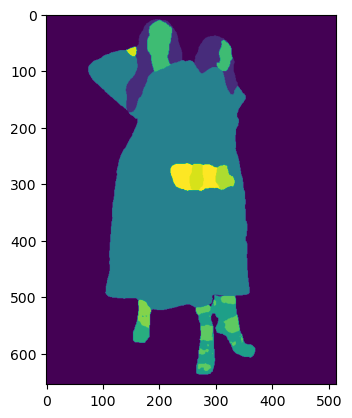

In [40]:
from transformers import SegformerImageProcessor, AutoModelForSemanticSegmentation
from PIL import Image
import requests
import matplotlib.pyplot as plt
import torch.nn as nn

processor = SegformerImageProcessor.from_pretrained("mattmdjaga/segformer_b2_clothes")
model = AutoModelForSemanticSegmentation.from_pretrained("mattmdjaga/segformer_b2_clothes")

# url = "https://plus.unsplash.com/premium_photo-1673210886161-bfcc40f54d1f?ixlib=rb-4.0.3&ixid=MnwxMjA3fDB8MHxzZWFyY2h8MXx8cGVyc29uJTIwc3RhbmRpbmd8ZW58MHx8MHx8&w=1000&q=80"
url = "https://images.asos-media.com/products/asos-edition-large-scale-floral-and-leaf-embroidered-midi-dress-in-cream/202481031-1-cream?$n_640w$&wid=513&fit=constrain"

image = Image.open(requests.get(url, stream=True).raw)
inputs = processor(images=image, return_tensors="pt")

outputs = model(**inputs)
logits = outputs.logits.cpu()

upsampled_logits = nn.functional.interpolate(
    logits,
    size=image.size[::-1],
    mode="bilinear",
    align_corners=False,
)

pred_seg = upsampled_logits.argmax(dim=1)[0]
plt.imshow(pred_seg)

tmp = pred_seg == 7.
plt.imshow(tmp)

# search over a category in the dataset

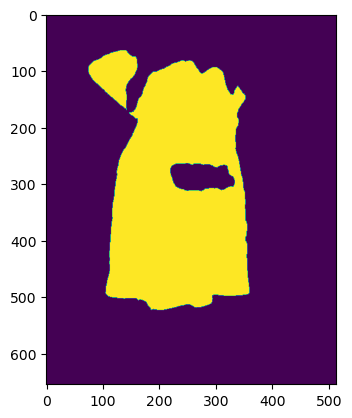

In [42]:
tmp = pred_seg == 7.
plt.imshow(tmp)

In [ ]:
dress_embed = text_to_embeddings(["lady in a dress"]).t()

dists = candidate_vembeds @ dress_embed.detach().numpy()

In [ ]:
a = torch.randn(512)
# torch.zeros_like(a).shape

torch.zeros(512).shape

In [ ]:
category_vembeds = candidate_vembeds
dim = category_vembeds.shape[1]
index = faiss.IndexFlatIP(dim)
index.add(category_vembeds)


def search(images, texts, wimages, wtexts, index, k=10):
    with torch.no_grad():
        query_vembeds = images_to_embeddings(images)
        query_tembeds = text_to_embeddings(texts)
        
    new_query = torch.zeros(512)
    for i in range(len(images)):
        new_query += query_vembeds[i] * wimages[i]
    
    for i in range(len(texts)):
        new_query += query_tembeds[i] * wtexts[i]
        
    new_query = new_query / new_query.norm(p=2, dim=-1, keepdim=True)

    new_query = new_query.unsqueeze(0).detach().numpy()
    dists, idxs = index.search(new_query, k)

    return dists, idxs

In [ ]:
category_vembeds = candidate_vembeds
dim = category_vembeds.shape[1]
index = faiss.IndexFlatIP(dim)
index.add(category_vembeds)

# get our query embeddings
# image_url1 = "https://i.pinimg.com/474x/53/37/d5/5337d5464816d2c405b80cb7283edaa9.jpg"
# image_url1 = "https://i.pinimg.com/474x/65/76/5d/65765da55a1c7043d13908e098d62814.jpg"

# image_url1 = "https://i.pinimg.com/474x/7c/c8/e3/7cc8e31cd06fca4e6aa5c9f1a550fe1b.jpg"
# image_url2 = "https://i.pinimg.com/474x/e3/7d/93/e37d93f00bb5773b2e3cf46d06ea01c7.jpg"

# image_url2 = "https://i.pinimg.com/564x/2a/da/f7/2adaf77f93508acd3e2d3448768be26b.jpg"
image_url2 = "https://i.pinimg.com/564x/6f/38/29/6f38294fdc3f59e20be41c7e66f0bcaf.jpg"
image_url1 = "https://i.pinimg.com/564x/25/2c/5c/252c5cb1b521c13a97045bc73add3751.jpg"
# image_url = "https://i.pinimg.com/564x/f9/9c/77/f99c77136c9b0af5eab79bfcbd414aed.jpg"
# image_url = "https://i.pinimg.com/564x/99/8c/14/998c14a26d8bedcf39c63265d332fa75.jpg"
k = 50


image1 = Image.open(requests.get(image_url1, stream=True).raw)
image2 = Image.open(requests.get(image_url2, stream=True).raw)

images = [image1, image2]
texts = ["a woman in a dress", "a catalog photo of a dress"]

wimages = [5., 0.]
wtexts = [0., 0.]

dists, idxs = search(images, texts, wimages, wtexts, index=index, k=k)

# plot
fig, axes = plt.subplots(1 + (k // 2), 2, 
                         figsize = (5, 50), 
                         gridspec_kw={'height_ratios': [3] + [1] * (k//2),})

for ax in axes.ravel():
    ax.axis("off")
    
axes[0, 0].imshow(image1)
axes[0, 1].imshow(image2)
axes[0, 0].set_title("moodboard images")

i, j = 1, 0
for idx in idxs[0]:
    ax = axes[i, j]
    ax.imshow(asos_dataset[idx][0])
    ax.set_aspect("equal")
    j += 1
    if j == 2:
        j = 0
        i += 1

plt.subplots_adjust(hspace=0.0, wspace = 0.0)
plt.show()